# Exercise 2 - Model Training and Evaluation

In [13]:
#imports
import joblib
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np


In [14]:
import re

#load previously saved artifacts
tfidf = joblib.load("../artifacts/punctuation/tfidf_vectorizer.joblib")
best_lr_l2 = joblib.load("../artifacts/punctuation/models/logreg_l2_best.joblib")
best_lr_l1 = joblib.load("../artifacts/punctuation/models/logreg_l1_best.joblib")
best_mlp   = joblib.load("../artifacts/punctuation/models/mlp_best.joblib")

#load data (same splits used earlier)
train_csv = "../data/train.csv"
val_csv   = "../data/val.csv"
test_csv  = "../data/test.csv"

val = pd.read_csv(val_csv)
train = pd.read_csv(train_csv)
test = pd.read_csv(test_csv)

# preprocess (same method applied earlier)
def clean_data(text):
    #check for actual missing values
    if pd.isna(text) or text is None:
        return None
        
    #convert to string and strip whitespace
    text_str = str(text).lower().strip()
    
    #check for literal string "None", "nan", or empty
    if text_str in ['none', 'nan', 'null', '']:
        return None
    
    return text_str

val['text_clean'] = val['Text'].apply(clean_data)
val = val.dropna(subset=['text_clean']).reset_index(drop=True)

X_val = tfidf.transform(val['text_clean'])
y_val = val['Label'].values
feature_names = tfidf.get_feature_names_out()

#target class names
class_names = ["Real", "Fake"]

/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfTransformer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Trying to unpickle estimator TfidfVectorizer from version 1.3.0 when using version 1.7.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(
/Library/Frameworks/Python.framework/Versions/3.13/lib/python3.13/site-packages/sklearn/base.py:442: InconsistentVersionWarning: Tr

## a) For your best Logistic Regression model, extract and visualize the weights in a bar plot:
### • Top 10 words most indicative of fake news
### • Top 10 words most indicative of real news

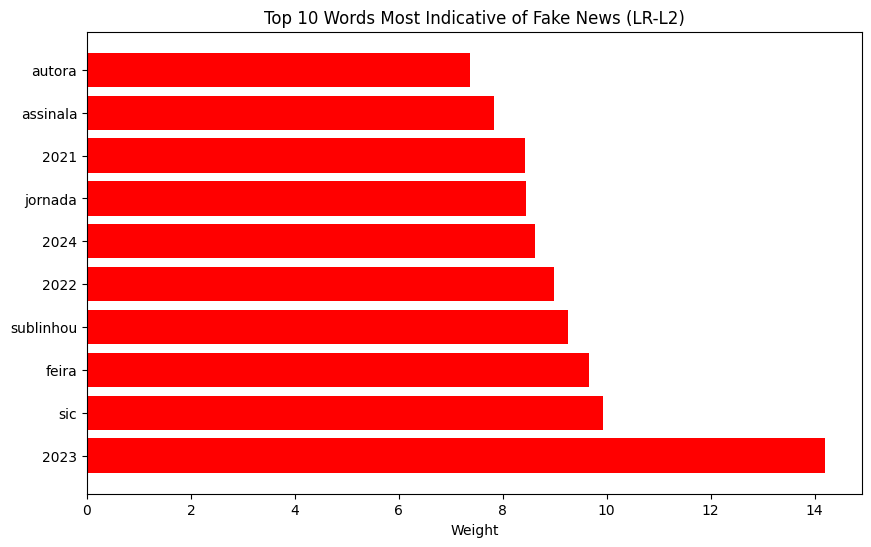

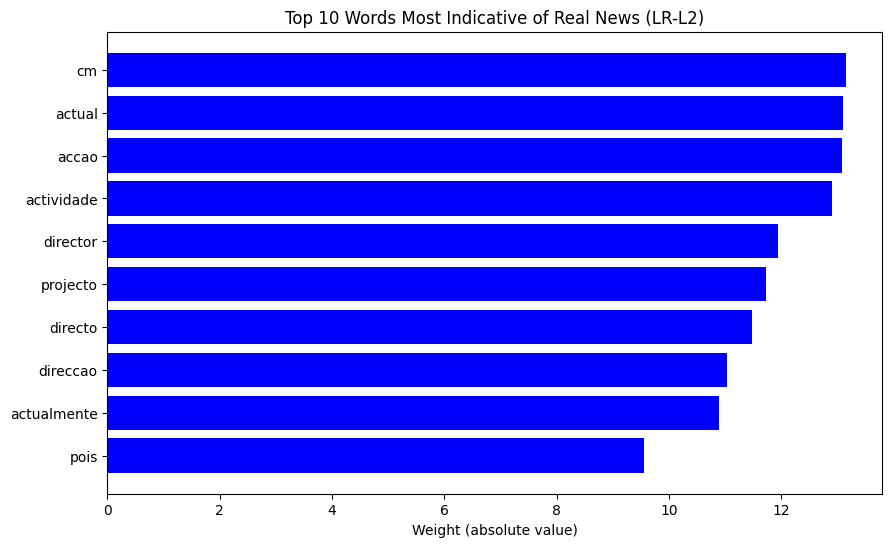

In [15]:
weights = best_lr_l2.coef_[0] #the best lr model was the l2

#top 10 fake news
top_fake_idx = np.argsort(weights)[-10:]
top_fake_words = feature_names[top_fake_idx]
top_fake_vals = weights[top_fake_idx]

#top 10 real news
top_real_idx = np.argsort(weights)[:10]
top_real_words = feature_names[top_real_idx]
top_real_vals = weights[top_real_idx]

#plot (Fake)
plt.figure(figsize=(10,6))
plt.barh(top_fake_words, top_fake_vals, color="red")
plt.title("Top 10 Words Most Indicative of Fake News (LR-L2)")
plt.xlabel("Weight")
plt.gca().invert_yaxis()
plt.show()

#plot (Real)
plt.figure(figsize=(10,6))
plt.barh(top_real_words, -top_real_vals, color="blue")
plt.title("Top 10 Words Most Indicative of Real News (LR-L2)")
plt.xlabel("Weight (absolute value)")
plt.gca().invert_yaxis()
plt.show()

## b) Compare L1 vs L2 regularized models: How many features have non-zero weights in each? What does this tell you about feature selection? When would you prefer L1 vs L2 regularization for text classification?

Total features: 5000
Non-zero (L1): 2025
Non-zero (L2): 5000
L1 removed: 2975
L2 removed: 0
L1 non-zero features: 2025
L2 non-zero features: 5000


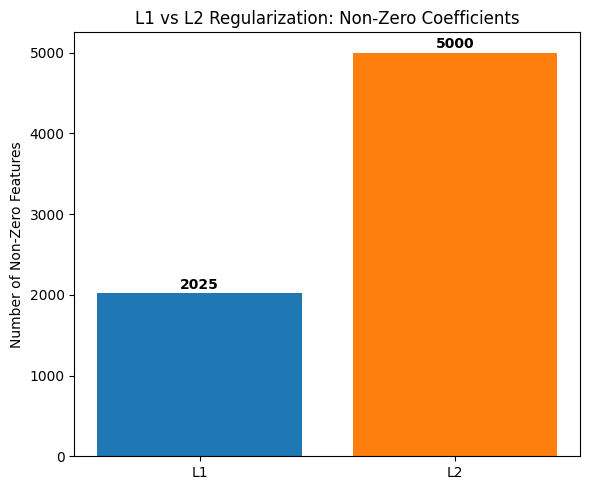

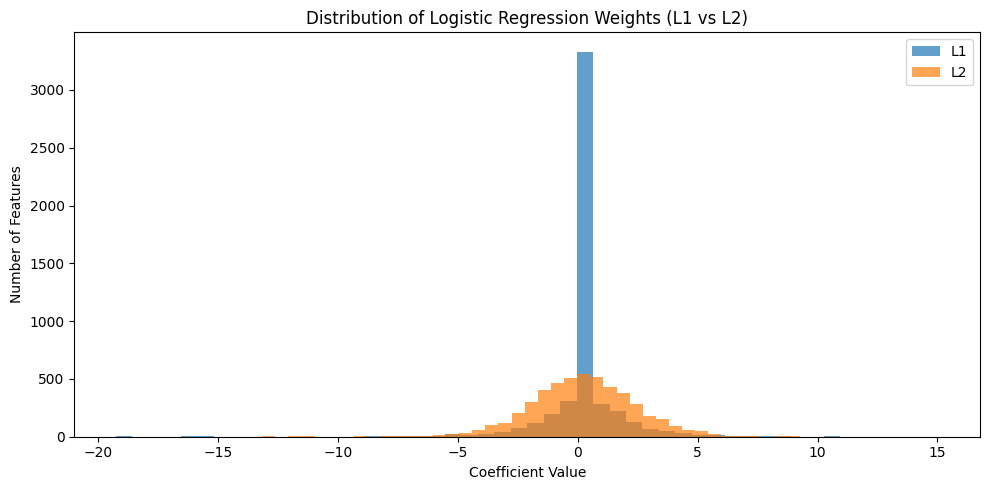

In [16]:
nz_l2 = np.count_nonzero(best_lr_l2.coef_)
nz_l1 = np.count_nonzero(best_lr_l1.coef_)
total = len(feature_names)

print("Total features:", total)
print("Non-zero (L1):", nz_l1)
print("Non-zero (L2):", nz_l2)
print("L1 removed:", total - nz_l1)
print("L2 removed:", total - nz_l2)

import matplotlib.pyplot as plt
import numpy as np

# Assuming you already have your best logistic regression models loaded
# best_lr_l1 and best_lr_l2

# Extract coefficients
coef_l1 = best_lr_l1.coef_.flatten()
coef_l2 = best_lr_l2.coef_.flatten()

# Count non-zero weights
non_zero_l1 = np.sum(coef_l1 != 0)
non_zero_l2 = np.sum(coef_l2 != 0)

print(f"L1 non-zero features: {non_zero_l1}")
print(f"L2 non-zero features: {non_zero_l2}")

# ---- Bar chart of non-zero features ----
plt.figure(figsize=(6,5))
plt.bar(['L1', 'L2'], [non_zero_l1, non_zero_l2], color=['#1f77b4', '#ff7f0e'])
plt.ylabel("Number of Non-Zero Features")
plt.title("L1 vs L2 Regularization: Non-Zero Coefficients")
for i, v in enumerate([non_zero_l1, non_zero_l2]):
    plt.text(i, v + 50, str(v), ha='center', fontweight='bold')
plt.tight_layout()
plt.show()

# ---- Histogram of weight distributions ----
plt.figure(figsize=(10,5))
plt.hist(coef_l1, bins=50, alpha=0.7, label='L1', color='#1f77b4')
plt.hist(coef_l2, bins=50, alpha=0.7, label='L2', color='#ff7f0e')
plt.xlabel("Coefficient Value")
plt.ylabel("Number of Features")
plt.title("Distribution of Logistic Regression Weights (L1 vs L2)")
plt.legend()
plt.tight_layout()
plt.show()


## c) For your best Logistic Regression model, select samples in the validation set with ID 2921, 2437, 5557, 1697, and extract explanations with LIME (Ribeiro et al., 2016; Lundberg and Lee, 2017). For a practical reference, check [this](https://marcotcr.github.io/lime/tutorials/Lime%20-%20basic%20usage%2C%20two%20class%20case.html)

In [17]:
#import lime and displayer
from lime.lime_text import LimeTextExplainer
from IPython.display import display, HTML

In [18]:
def predict_proba_text(text_list):
    X = tfidf.transform(text_list)
    return best_lr_l2.predict_proba(X)

explainer = LimeTextExplainer(class_names=class_names)

sample_ids = [2921, 2437, 5557, 1697]

lime_explanations_lr = {}

for id in sample_ids:
    text = val.loc[id, 'text_clean'] #get text

    exp = explainer.explain_instance(
        text,
        predict_proba_text,
        num_features=10
    )
    
    lime_explanations_lr[id] = exp 

    print("\nSample ID:", id)
    display(exp.as_list())
    display(HTML(exp.as_html(text=text)))




Sample ID: 2921


[(np.str_('2023'), 0.04395446807438973),
 (np.str_('2024'), 0.03157730060783598),
 (np.str_('sul'), 0.028329724343027038),
 (np.str_('no'), 0.027472288227842954),
 (np.str_('do'), 0.023815027660694578),
 (np.str_('ao'), 0.020911302827950642),
 (np.str_('se'), -0.018564801394070237),
 (np.str_('temperaturas'), -0.010803743897383788),
 (np.str_('da'), -0.005887815507360581),
 (np.str_('boletim'), -0.003575358830213491)]


Sample ID: 2437


[(np.str_('director'), -0.07667513327444242),
 (np.str_('tivessem'), 0.02953178471607653),
 (np.str_('deles'), -0.02476984080348402),
 (np.str_('há'), 0.020399214667637958),
 (np.str_('se'), -0.019380493688703277),
 (np.str_('teria'), -0.01849374536267949),
 (np.str_('anos'), 0.016950984591006475),
 (np.str_('alemão'), -0.01650821448229265),
 (np.str_('terra'), -0.015746995626063173),
 (np.str_('coronavírus'), -0.011256102339200396)]


Sample ID: 5557


[(np.str_('no'), 0.08569039314582917),
 (np.str_('temporada'), 0.07212689725102488),
 (np.str_('época'), 0.06718803855906527),
 (np.str_('em'), 0.06658806058662327),
 (np.str_('mas'), 0.06158671387754146),
 (np.str_('não'), -0.030790348998730715),
 (np.str_('completamente'), -0.02318968186846827),
 (np.str_('se'), -0.019157141300966903),
 (np.str_('seu'), -0.00667345715011665),
 (np.str_('com'), -0.0021414913473645526)]


Sample ID: 1697


[(np.str_('dívida'), -0.1458675110395326),
 (np.str_('em'), 0.11352088236414275),
 (np.str_('euros'), -0.06447441912049418),
 (np.str_('do'), 0.0634856695032353),
 (np.str_('os'), -0.052729812980072704),
 (np.str_('mas'), 0.046738413030192855),
 (np.str_('portugal'), -0.046426983934158526),
 (np.str_('garantir'), 0.04591986696118435),
 (np.str_('para'), 0.04527267125129406),
 (np.str_('embora'), -0.03755370998145116)]

## d) For your MLP, select samples in the validation set with ID 2921, 2437, 5557, 1697, and extract explanations with LIME and permutation importance. For permutation importance, select 1K random samples. Visualize the results and discuss their differences.

### Lime Analysis

In [19]:
def predict_proba_text_mlp(text_list):
    X = tfidf.transform(text_list)
    return best_mlp.predict_proba(X)

explainer = LimeTextExplainer(class_names=["Real", "Fake"])

sample_ids = [2921, 2437, 5557, 1697] #ids

lime_explanations_mlp = {}

for id in sample_ids:
    text = val.loc[id, 'text_clean']

    exp = explainer.explain_instance(
        text,
        predict_proba_text_mlp,
        num_features=10
    )

    lime_explanations_mlp[id] = exp
    
    print(f"\nSample ID: {id}")
    display(exp.as_list())
    display(HTML(exp.as_html(text=text)))



Sample ID: 2921


[(np.str_('2023'), 0.05251183488949603),
 (np.str_('el'), 0.04526461579820578),
 (np.str_('se'), -0.03537558997143011),
 (np.str_('2024'), 0.03304479340555577),
 (np.str_('menos'), 0.026559614691595918),
 (np.str_('da'), -0.026547019341124974),
 (np.str_('para'), 0.025281704129686586),
 (np.str_('organização'), 0.025273740068492194),
 (np.str_('dos'), 0.023310156245669525),
 (np.str_('temperaturas'), -0.009090736295350043)]


Sample ID: 2437


[(np.str_('director'), -0.009641581592647669),
 (np.str_('deles'), -0.007058709832512168),
 (np.str_('teria'), -0.006429692742395842),
 (np.str_('se'), -0.006288745789387336),
 (np.str_('alemão'), -0.00540440087908423),
 (np.str_('50'), -0.005285181231057286),
 (np.str_('tivessem'), 0.005147665652800033),
 (np.str_('coronavírus'), -0.004954332331371888),
 (np.str_('há'), 0.004311139695053114),
 (np.str_('uma'), 0.0037637070137071594)]


Sample ID: 5557


[(np.str_('para'), 0.04552915398085728),
 (np.str_('muito'), 0.033939940967357904),
 (np.str_('do'), 0.0320846019761828),
 (np.str_('na'), 0.029463164482869612),
 (np.str_('benfica'), 0.028149871975001087),
 (np.str_('da'), -0.017247447661228894),
 (np.str_('seu'), 0.0020921769746575307),
 (np.str_('ele'), 0.0010405401382096056),
 (np.str_('se'), -0.0007313124012326758),
 (np.str_('2015'), -0.0004023167844223731)]


Sample ID: 1697


[(np.str_('euros'), -0.060554108703826284),
 (np.str_('os'), -0.060256174606657914),
 (np.str_('dívida'), -0.05976140886385768),
 (np.str_('em'), 0.04632567845660076),
 (np.str_('portugal'), -0.04449844595070563),
 (np.str_('para'), -0.03602844151885571),
 (np.str_('embora'), -0.02995828623170242),
 (np.str_('garantir'), 0.018310270028147134),
 (np.str_('títulos'), 0.01137048004501565),
 (np.str_('milhões'), 0.00992843491871746)]

### Permutation Importance (1000 samples)

Running permutation importance...


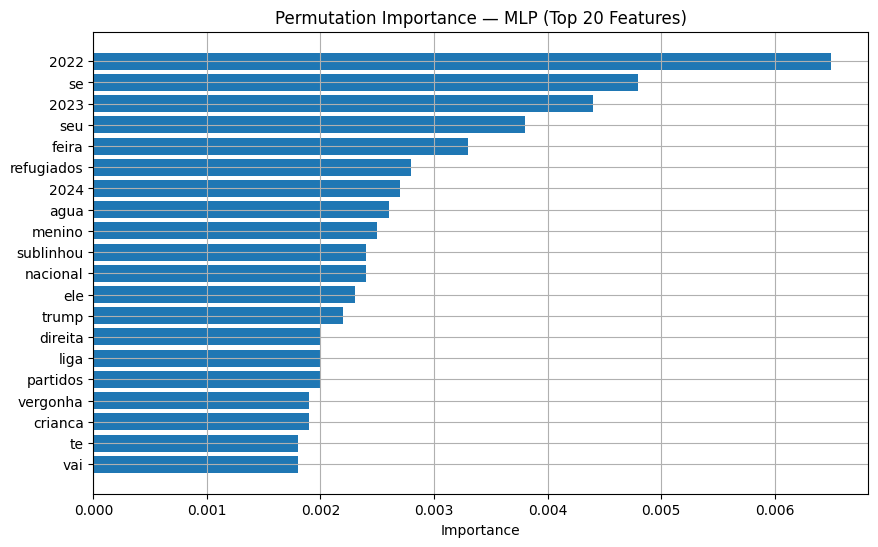

In [20]:
from sklearn.inspection import permutation_importance

#sample 1000 random validation items
sample_idx = np.random.choice(X_val.shape[0], 1000, replace=False)
X_val_sample = X_val[sample_idx].toarray()
y_val_sample = y_val[sample_idx]

print("Running permutation importance...")

result = permutation_importance(
    best_mlp, X_val_sample, y_val_sample,
    n_repeats=10,
    random_state=42,
    n_jobs=-1
)

# Top 20 most important features
sorted_idx = result.importances_mean.argsort()[::-1][:20]
top_features = feature_names[sorted_idx]
top_scores = result.importances_mean[sorted_idx]

plt.figure(figsize=(10, 6))
plt.barh(top_features, top_scores)
plt.gca().invert_yaxis()
plt.title("Permutation Importance — MLP (Top 20 Features)")
plt.xlabel("Importance")
plt.grid(True)
plt.show()


### Extra: MLP vs Logistic Regression Heatmap

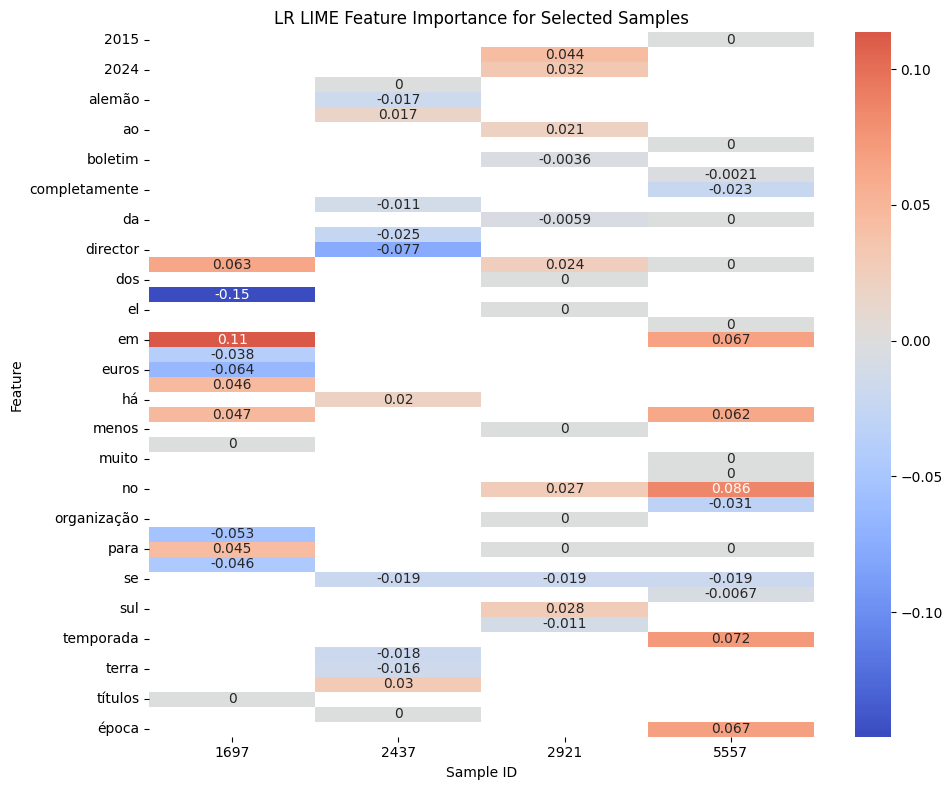

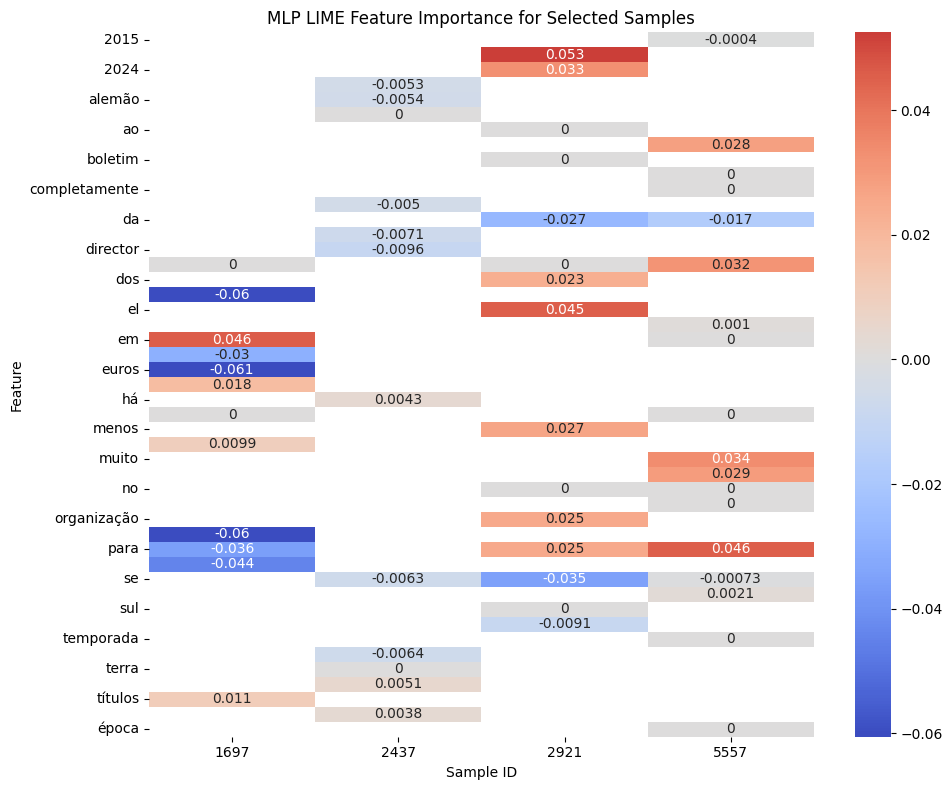

In [24]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

def lime_to_dict(explanation):
    """
    Convert a LIME Explanation object into a dictionary: {feature_name: weight}
    """
    return dict(explanation.as_list())

# Combine LR and MLP for the same features
def prepare_heatmap_data(lime_dict, model_name):
    """Convert LIME dict to DataFrame suitable for heatmap"""
    df_list = []
    for sample_id, feat_weights in lime_dict.items():
        df_temp = pd.DataFrame.from_dict(feat_weights, orient='index', columns=[f"{model_name}"])
        df_temp['sample_id'] = sample_id
        df_temp['feature'] = df_temp.index
        df_list.append(df_temp.reset_index(drop=True))
    return pd.concat(df_list)

lime_dict_lr = {sid: lime_to_dict(exp) for sid, exp in lime_explanations_lr.items()}
lime_dict_mlp = {sid: lime_to_dict(exp) for sid, exp in lime_explanations_mlp.items()}

df_lr = prepare_heatmap_data(lime_dict_lr, 'LR')
df_mlp = prepare_heatmap_data(lime_dict_mlp, 'MLP')

# Merge on sample_id and feature to compare weights
df_combined = pd.merge(df_lr, df_mlp, on=['sample_id', 'feature'], how='outer').fillna(0)

# Pivot for heatmap: features as rows, samples as columns
# Here we can show one heatmap per model or combine models in one figure
for model in ['LR', 'MLP']:
    heatmap_data = df_combined.pivot(index='feature', columns='sample_id', values=model)
    plt.figure(figsize=(10,8))
    sns.heatmap(heatmap_data, annot=True, cmap='coolwarm', center=0)
    plt.title(f"{model} LIME Feature Importance for Selected Samples")
    plt.ylabel("Feature")
    plt.xlabel("Sample ID")
    plt.tight_layout()
    plt.show()
